# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 10.04.2023

Мягкий дедлайн: 24.04.2022 23:59 MSK

Жёсткий дедлайн: 30.04.2022 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). 

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [4]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

In [4]:
from IPython.display import HTML

HTML('<img src="DimwittedBrightAntbear-size_restricted.gif">')

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [14]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])  # почему 1: ?
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        D = np.diag(np.sum(X, axis=1))
        L = D - X
        # откуда берутся комплексные собственные числа ?
        eigenvalues, eigenvectors = np.linalg.eig(L)
        eigenvectors = eigenvectors.T
        # eigenvalues = np.real(eigenvalues[np.iscomplex(eigenvalues) == False]) - не знаю, нужно ли оставить только вещественные собственные значения
        eigenvalues = eigenvalues[eigenvalues != 0]  # если вдруг граф не связный

        eigenvalues_indexes = {}
        for i in range(eigenvalues.shape[0]):
            eigenvalues_indexes[eigenvalues[i]] = i  # останется только последний собственный вектор для каждого собственного значения - это ок, нам все равно, какой

        sorted_eigenvalues = sorted(eigenvalues_indexes.keys())  # key=lambda x: np.abs(x) ?

        result = []
        for i in range(self.n_components):
            result.append(np.real(eigenvectors[eigenvalues_indexes[sorted_eigenvalues[i]]]))

        return np.array(result).T


Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [55]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices,)
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

/Users/main/Desktop/MO2/venv/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [4]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [5]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [8]:
from tqdm import tqdm


def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops for each route,
                   e.g. routes['A1'] = pd.DataFrame of stops
    '''

    route_names = pd.unique(data['RouteNumbers_en'].str.split(pat=';').explode().apply(lambda x: x.strip()))

    routes = {}
    for name in tqdm(route_names):
        routes[name] = data[data['RouteNumbers_en'].str.contains(name)]['ID_en'].to_list()

    return routes


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''

    # посчитаем полный граф расстояний между остановками для каждого маршрута, отсортируем по сумме
    sorted_routes = {}
    for route_name, route in tqdm(routes.items()):
        distances_sum = {}
        for stop_id in route:
            distances_sum[stop_id] = 0

        for i in range(len(route) - 1):
            # 10e6 потому что точности может не хватить
            latitude_i = data[data['ID_en'] == route[i]]['Latitude_WGS84_en'].iloc[0] * 10e6
            longitude_i = data[data['ID_en'] == route[i]]['Longitude_WGS84_en'].iloc[0] * 10e6
            for j in range(i + 1, len(route)):
                latitude_j = data[data['ID_en'] == route[j]]['Latitude_WGS84_en'].iloc[0] * 10e6
                longitude_j = data[data['ID_en'] == route[j]]['Longitude_WGS84_en'].iloc[0] * 10e6
                distance = np.sqrt(np.square(latitude_i - latitude_j) + np.square(longitude_i - longitude_j))
                distances_sum[route[i]] += distance
                distances_sum[route[j]] += distance

        sorted_routes[route_name] = sorted(route, key=lambda x: distances_sum[x], reverse=True)
        # print(sorted(distances_sum.items(), key=lambda x: x[1], reverse=True))
        # print(sorted(route, key = lambda x: distances_sum[x], reverse=True))
        # return
    return sorted_routes


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''
    adjacency_matrix = pd.DataFrame(data=0, index=pd.unique(data['ID_en']), columns=pd.unique(data['ID_en']), dtype=int)

    for route_name, route in sorted_routes.items():
        for i in range(len(route) - 1):
            adjacency_matrix[route[i]][route[i + 1]] += 1
            adjacency_matrix[route[i + 1]][route[i]] += 1

    return adjacency_matrix

In [24]:
%%time
routes = get_routes(data)
len(routes)

100%|██████████| 163/163 [00:00<00:00, 1011.60it/s]

CPU times: user 164 ms, sys: 4.11 ms, total: 168 ms
Wall time: 166 ms


163

In [10]:
%%time
sorted_routes = sort_routes(data, routes)

100%|██████████| 163/163 [01:06<00:00,  2.46it/s]

CPU times: user 1min 5s, sys: 527 ms, total: 1min 6s
Wall time: 1min 6s


In [11]:
%%time
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)
print(adjacency_matrix)

         347      349      479      480      481      482      483       
347            0        0        0        0        0        0        0  \
349            0        0        0        0        0        0        0   
479            0        0        0        2        0        0        0   
480            0        0        2        0        1        0        0   
481            0        0        0        1        0        0        0   
...          ...      ...      ...      ...      ...      ...      ...   
5099           0        0        0        0        0        0        0   
1009191        0        0        0        0        0        0        0   
1009193        0        0        0        0        0        0        0   
1009239        0        0        0        0        0        0        0   
1009192        0        0        0        0        0        0        0   

         485      486      487      ...  6678     6726     10586    7512      
347            0        0       

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [45]:
import random

map = folium.Map([55.75215, 37.61819], zoom_start=12)
list_colors = [
    'red', 'green', 'blue', 'orange', 'violet'
]
i = 0
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        data['ID_en'].isin(sorted_routes[route_id]),
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords, color=list_colors[i]).add_to(map)
    i += 1

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [13]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''
    colors = ['#' + str(hex(random.randrange(0, 2 ** 24)))[2:] for label in np.unique(labels)]

    map = folium.Map([55.75215, 37.61819], zoom_start=12)
    for id, row in data.iterrows():
        folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                      radius=10, color=colors[labels[id]]).add_to(map)  # id == i?
    return map

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [14]:
from sklearn.cluster import KMeans

KMeans_clustering = KMeans(n_clusters=8)
KMeans_labels = KMeans_clustering.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
draw_clustered_map(data, KMeans_labels)

/Users/main/Desktop/MO2/venv/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [15]:
from sklearn.cluster import DBSCAN

DBSCAN_clustering = DBSCAN(eps=3 * 10e-4)
DBSCAN_labels = DBSCAN_clustering.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
draw_clustered_map(data, DBSCAN_labels)

In [56]:
graph_clustering = GraphClustering(n_clusters=20, n_components=10)
graph_clustering_labels = graph_clustering.fit_predict(adjacency_matrix)
draw_clustered_map(data, graph_clustering_labels)

/Users/main/Desktop/MO2/venv/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:**
kmeans разбивает на кластеры с центрами в пределенной точке, dbscan как будто просто выделяет группы точек с большей разрешающей способностью, в спектальной кластеризации иногда просматривались маршруты вдоль улиц, но много чего убиралось в один класс, вероятно можно подобрать параметры для более красивой картинки

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [5]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1289,politics,394.txt,Economy focus for election battle,Britain's economic future will be at the hear...
1872,tech,049.txt,Domain system scam fear,A system to make it easier to create website ...
1044,politics,149.txt,Blair returns from peace mission,Prime Minister Tony Blair has arrived back fr...
654,entertainment,145.txt,Sir Paul rocks Super Bowl crowds,Sir Paul McCartney wowed fans with a live min...
134,business,135.txt,Feta cheese battle reaches court,A row over whether only Greece should be allo...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [6]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [7]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to /Users/main/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/main/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/main/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [8]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [9]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [10]:
from wordcloud import WordCloud


def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

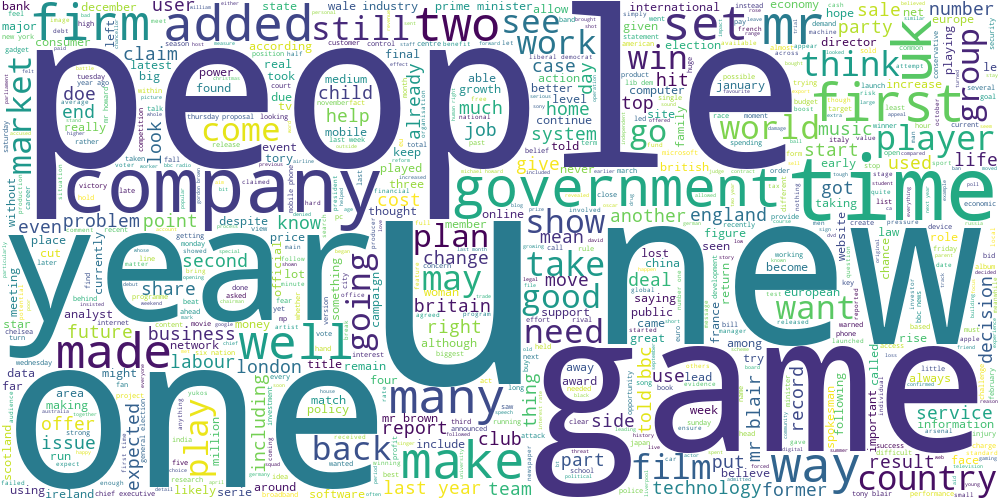

In [11]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:**
Темы получились достаточно интерпретируемыми.
Возможные заголовки:
1. government & law
2. markets & finance
3. politics (fear of pseudosocialism)
4. economy
5. games
6. movies
7. technology
8. music


In [18]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans, DBSCAN
tf_idf_vectorizer = TfidfVectorizer(min_df = 3, ngram_range = (1,1))
tf_idf = tf_idf_vectorizer.fit_transform(data['text'])

kmeans = KMeans(n_clusters=8)
kmeans_clusters = kmeans.fit_predict(tf_idf)

/Users/main/Desktop/MO2/venv/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


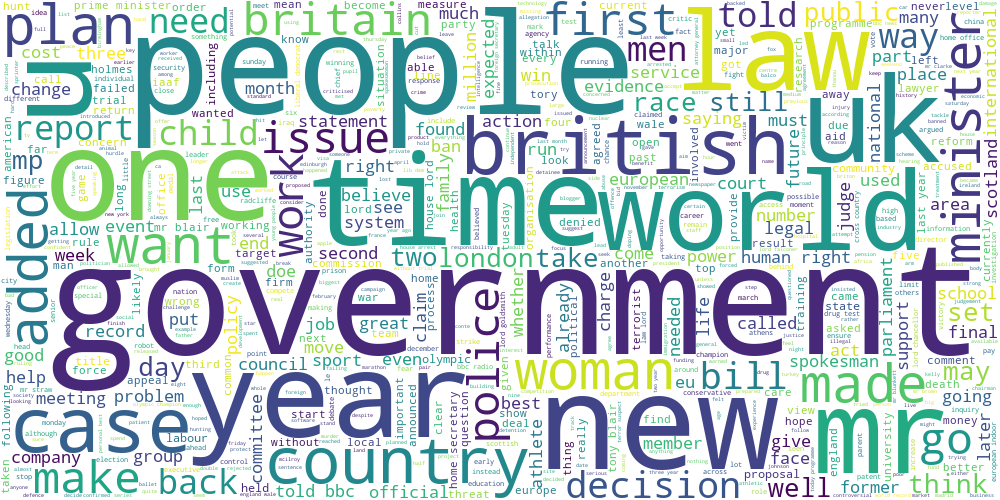

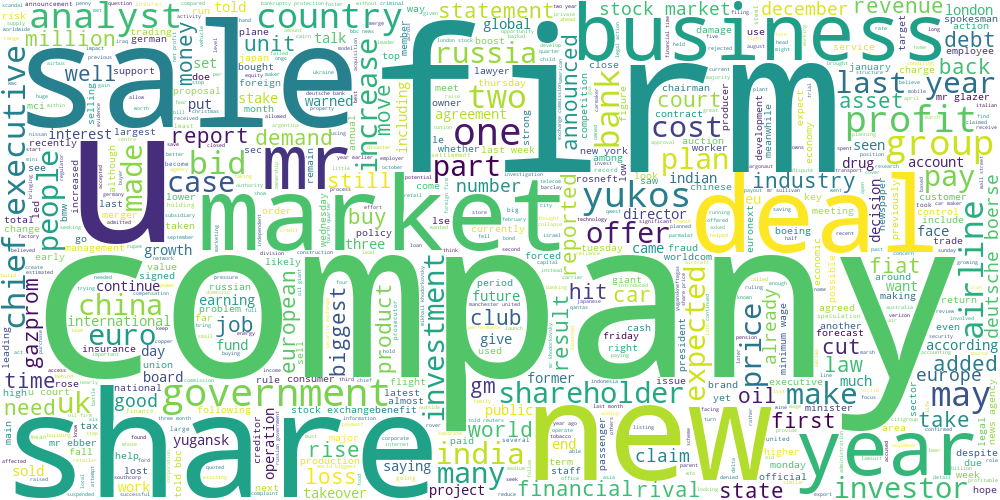

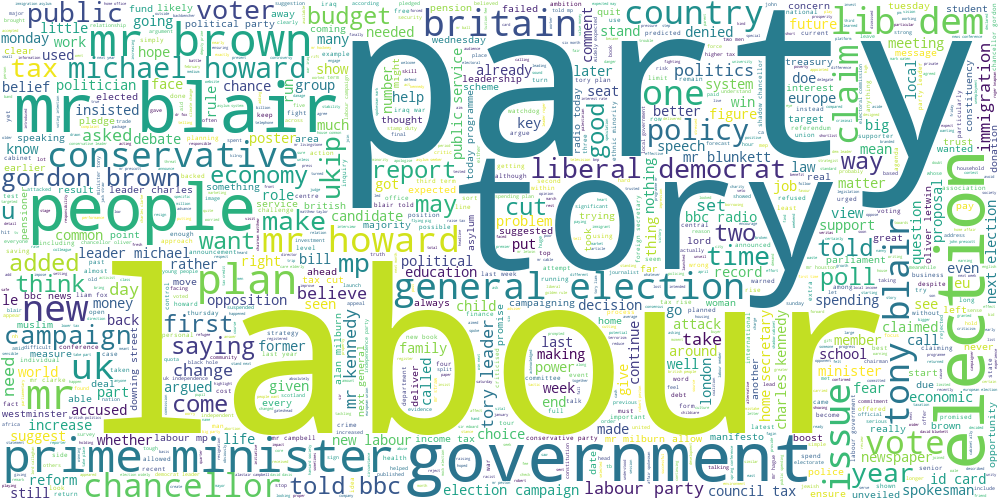

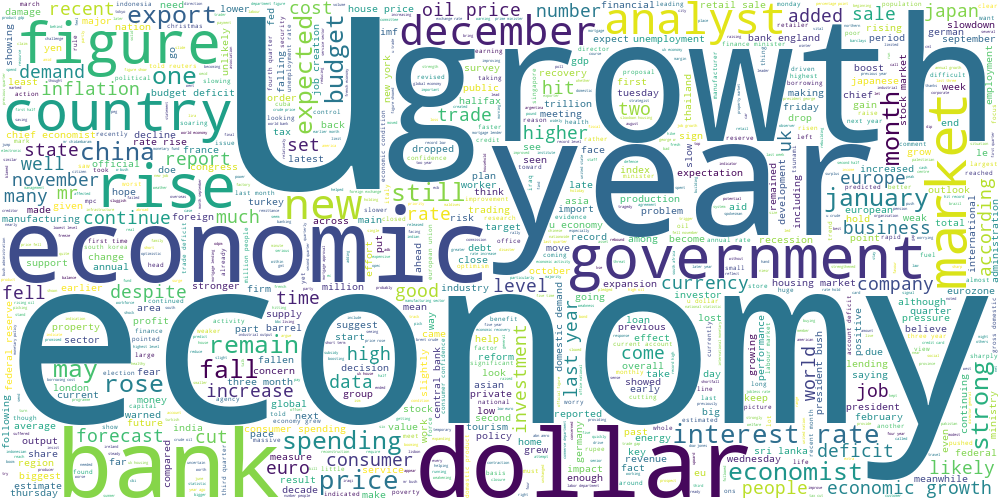

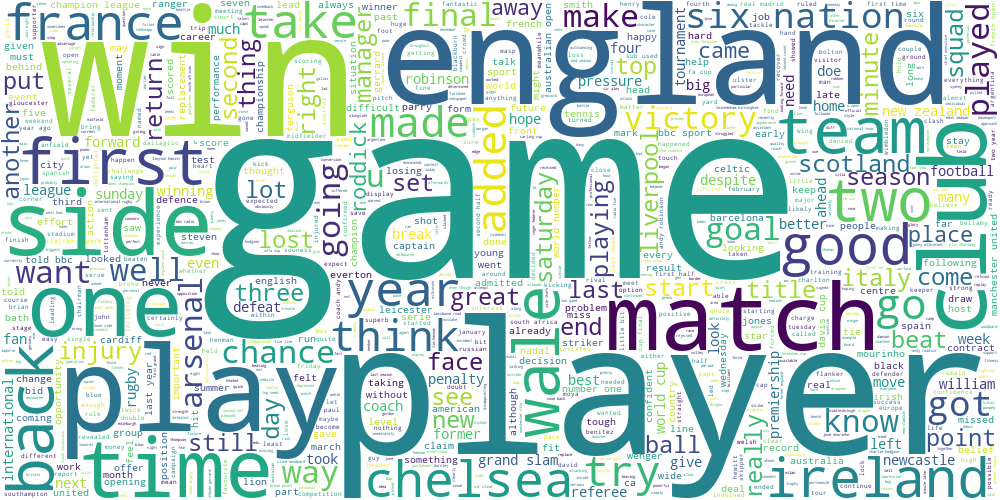

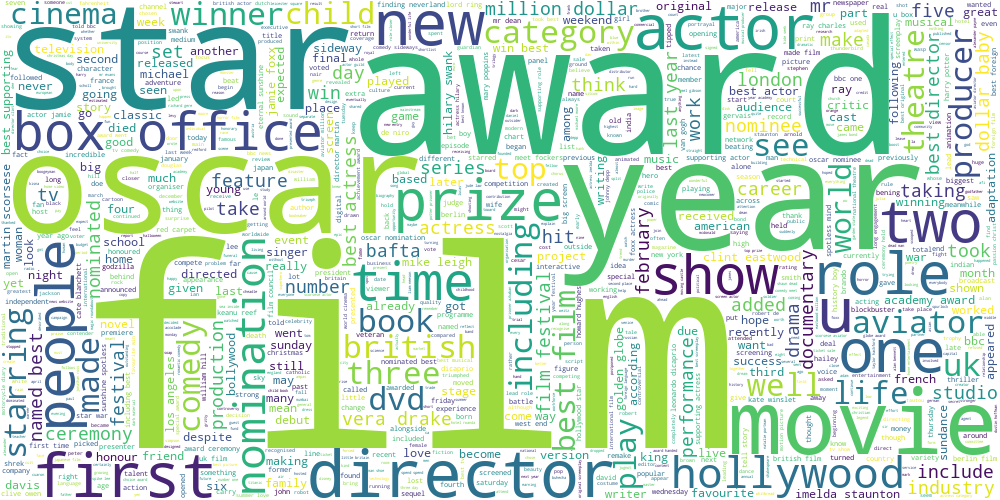

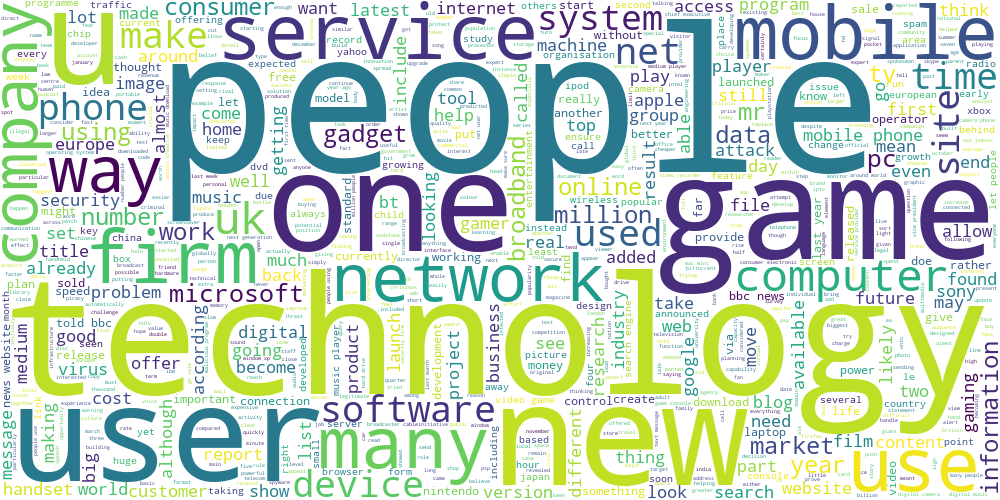

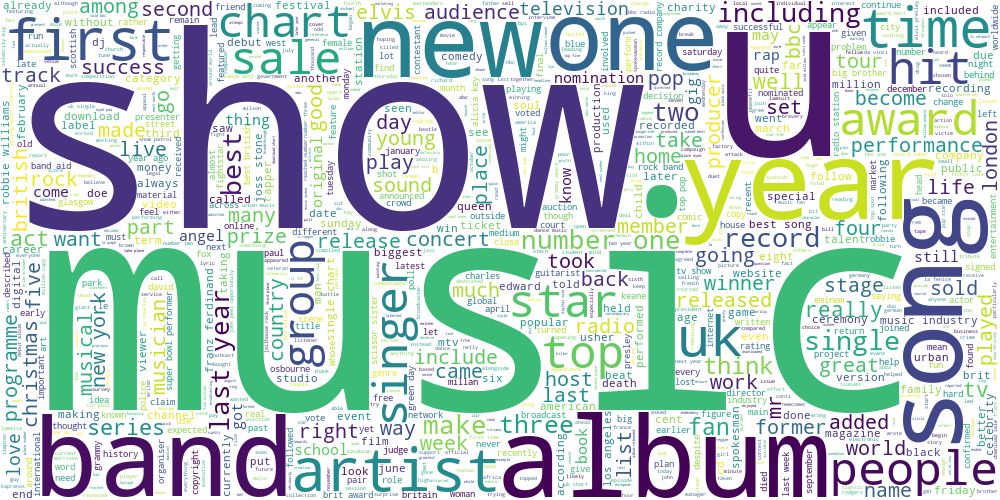

In [19]:
for i in range(8):
    display(draw_wordcloud(data[kmeans_clusters == i].text))

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:**
В общем темы и центры кластеров совпадают, но есть мусорные наиболее частые слова, вроде mr, которые, возможно, стоило удалить на этапе препроцессинга.

In [21]:
tf_idf_vectorizer.get_feature_names_out()[np.argmax(kmeans.cluster_centers_, axis = 1)]

array(['mr', 'company', 'mr', 'economy', 'game', 'film', 'mobile',
       'music'], dtype=object)

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [12]:
import matplotlib.pyplot as plt

In [13]:
def scatter_clusters(points, clusters):
    fig = plt.figure(figsize=(10,6), dpi = 100)
    plt.scatter(points[:, 0], points[:, 1], c = clusters)
    fig.show()

In [23]:
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD

tf_idf_pca = TruncatedSVD(n_components=50).fit_transform(tf_idf)
tf_idf_tsne = TSNE(n_components=2).fit_transform(tf_idf_pca)

In [25]:
from sklearn.cluster import DBSCAN, KMeans, SpectralClustering

/Users/main/Desktop/MO2/venv/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/var/folders/3f/zdr9bx9916d5985j006hy68c0000gn/T/ipykernel_66246/3502069133.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


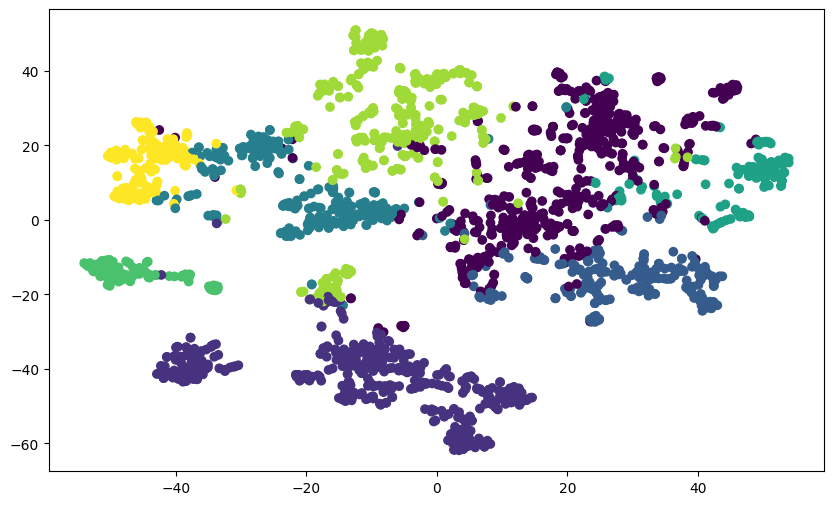

In [28]:
kmeans = KMeans(n_clusters=8)
kmeans_clusters = kmeans.fit_predict(tf_idf)
scatter_clusters(tf_idf_tsne, kmeans_clusters)

/var/folders/3f/zdr9bx9916d5985j006hy68c0000gn/T/ipykernel_66246/3502069133.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


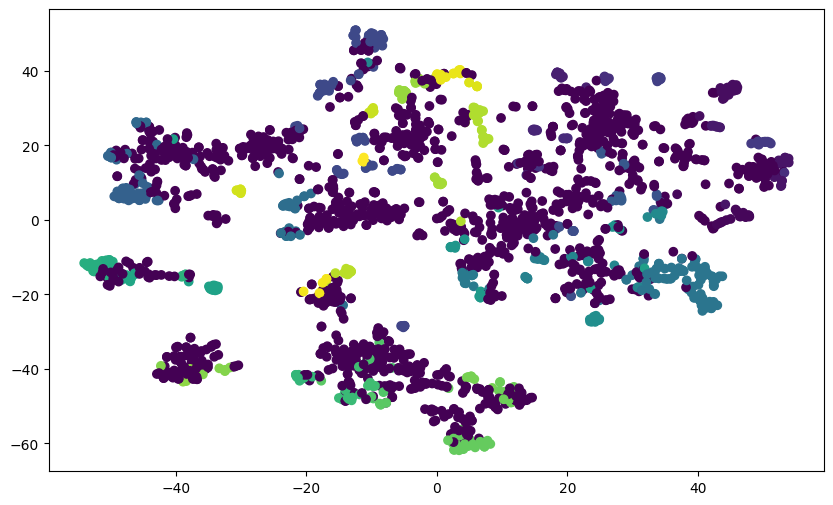

In [29]:
dbscan = DBSCAN(eps = 1.125)
dbscan_clusters = dbscan.fit_predict(tf_idf)
scatter_clusters(tf_idf_tsne, dbscan_clusters)

/var/folders/3f/zdr9bx9916d5985j006hy68c0000gn/T/ipykernel_66246/3502069133.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


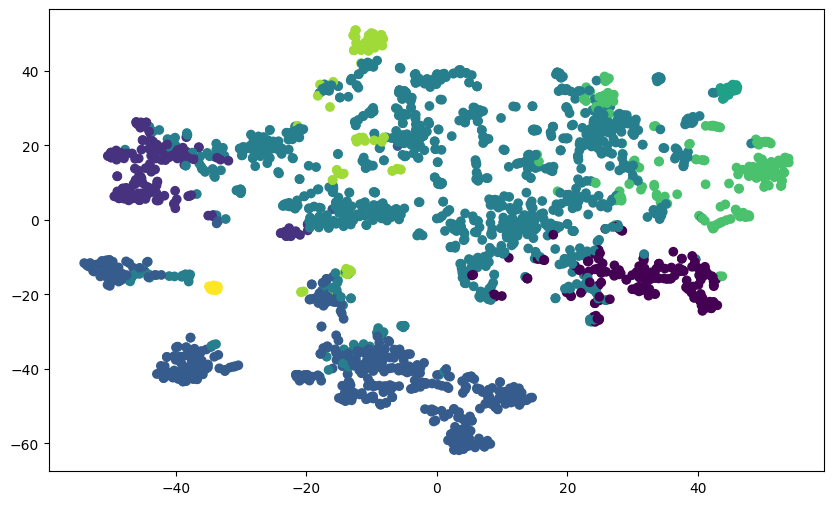

In [30]:
spectral_clustering = SpectralClustering(n_clusters=8)
spectral_clustering_clusters = spectral_clustering.fit_predict(tf_idf)
scatter_clusters(tf_idf_tsne, spectral_clustering_clusters)

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:**
k_means выдает кластеры примерно одного размера, содержимое n-мерных шаров с соответсвующими центрами масс - это хорошо видно на визуализации
dbscan имеет один доминирующий кластер и множество других мелких на фоне
спектральная кластеризация выдает результат отличный от k-means, достаточно сбалансированный, но также имеет одни выраженный доминирующий кластер (серый на картинке)
результаты в классификации текстов отличаются от результатов в классификации остановок - dbscan с остановками работает сильно более адекватно

я попробовал обучать dbscan на tf_idf после pca - получается примерно то же самое

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:**

In [31]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [32]:
bow = CountVectorizer(min_df=3, ngram_range = (1,1)).fit_transform(data['text'])

In [33]:
LDA_clusters = LatentDirichletAllocation(n_components=30).fit_transform(bow)
LDA_clusters.shape

(2225, 30)

In [34]:
LDA_clusters[0:2]

array([[1.61030596e-04, 1.61030596e-04, 1.61030596e-04, 1.61030596e-04,
        1.61030596e-04, 1.61030596e-04, 2.94801653e-02, 1.61030596e-04,
        6.30047566e-02, 1.61030596e-04, 1.61030596e-04, 1.61030596e-04,
        2.44067627e-01, 1.61030596e-04, 1.61030596e-04, 2.06512193e-02,
        1.61030596e-04, 6.49166530e-02, 1.61030596e-04, 1.61030596e-04,
        1.61030596e-04, 1.61030596e-04, 1.61030596e-04, 1.61030596e-04,
        1.61030596e-04, 2.95581802e-01, 2.78594073e-01, 1.61030596e-04,
        1.61030596e-04, 1.61030596e-04],
       [1.61030596e-04, 1.61030596e-04, 1.61030596e-04, 1.61030596e-04,
        1.61030596e-04, 1.61030596e-04, 1.61030596e-04, 1.61030596e-04,
        1.61030596e-04, 1.61030596e-04, 1.61030596e-04, 1.61030596e-04,
        1.61030596e-04, 1.61030596e-04, 1.61030596e-04, 1.61030596e-04,
        1.40837648e-01, 1.61030596e-04, 1.61030596e-04, 1.61030596e-04,
        3.50266491e-02, 1.61030596e-04, 1.61030596e-04, 1.61030596e-04,
        1.61030596e-04,

/Users/main/Desktop/MO2/venv/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/var/folders/3f/zdr9bx9916d5985j006hy68c0000gn/T/ipykernel_66246/3502069133.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


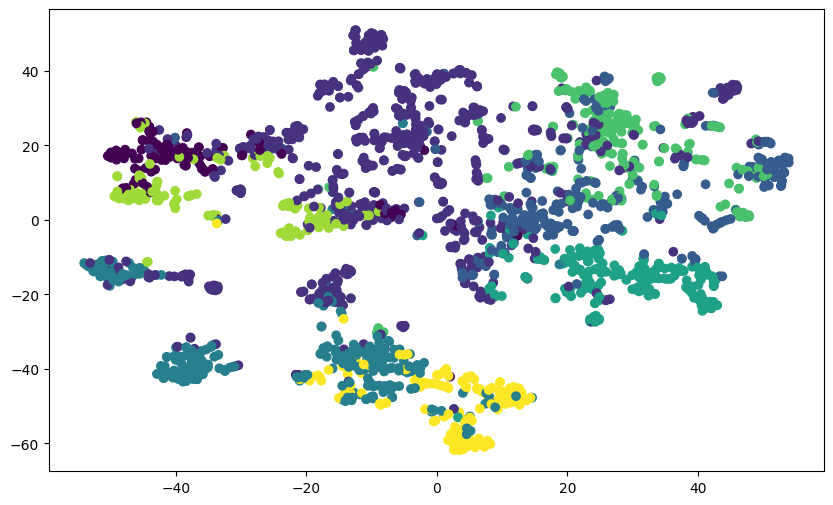

In [35]:
# обучим k-means на выходах LDA по аналогии со спектральной кластеризацией
kmeans_over_lda_clusters = KMeans(n_clusters=8).fit_predict(LDA_clusters)
scatter_clusters(tf_idf_tsne, kmeans_over_lda_clusters)

/var/folders/3f/zdr9bx9916d5985j006hy68c0000gn/T/ipykernel_66246/3502069133.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


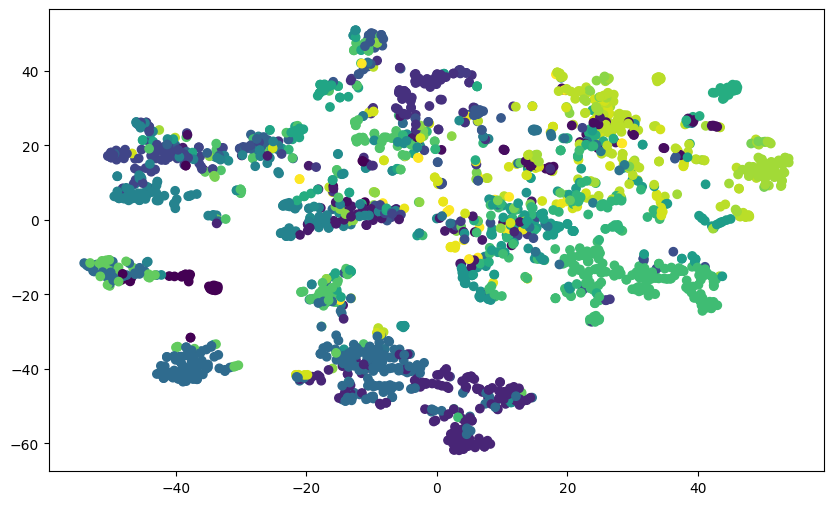

In [36]:
# попробуем просто взять номера самой вероятной темы
scatter_clusters(tf_idf_tsne, np.argmax(LDA_clusters, axis = 1))

## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

У какой модели получилось лучшее качество? С чем это связано?

**Ответ:**

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

In [47]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

(5,)

Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:**

## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку или в музей, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

In [ ]:
# YOUR CODE HERE (ノಠ益ಠ)ノ彡┻━┻